In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from DataTransformation import LowPassFilter
from scipy.signal import argrelextrema
from sklearn.metrics import mean_absolute_error

In [2]:
pd.options.mode.chained_assignment = None

In [3]:
plt.style.use("fivethirtyeight")
plt.rcParams["figure.figsize"] = (20, 5)
plt.rcParams["figure.dpi"] = 100
plt.rcParams["lines.linewidth"] = 2

In [4]:
df = pd.read_pickle("../../data/interim/data_processed_01.pkl")

FileNotFoundError: [Errno 2] No such file or directory: '../../data/interim/data_processed_01.pkl'

In [5]:
df = pd.read_pickle("../../data/interim/processed_data_01.pkl")

In [6]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,bench,heavy,B,64
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,bench,heavy,B,64
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,bench,heavy,B,64
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,bench,heavy,B,64
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,bench,heavy,B,64
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,row,medium,E,71
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,row,medium,E,71
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,row,medium,E,71


In [7]:
df = df[df["label"] != "rest"]

In [8]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,bench,heavy,B,64
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,bench,heavy,B,64
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,bench,heavy,B,64
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,bench,heavy,B,64
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,bench,heavy,B,64
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,row,medium,E,71
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,row,medium,E,71
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,row,medium,E,71


In [9]:
acc_r = df["acc_x"] ** 2 + df["acc_y"] ** 2 + df["acc_z"] ** 2
gyr_r = df["gyr_x"] ** 2 + df["gyr_y"] ** 2 + df["gyr_z"] ** 2
df["acc_r"] = np.sqrt(acc_r)
df["gyr_r"] = np.sqrt(gyr_r)

In [10]:
df["acc_r"]

epoch (ms)
2019-01-11 15:08:05.200    0.979669
2019-01-11 15:08:05.400    0.973752
2019-01-11 15:08:05.600    0.973795
2019-01-11 15:08:05.800    0.960118
2019-01-11 15:08:06.000    0.964953
                             ...   
2019-01-20 17:33:27.000    1.045408
2019-01-20 17:33:27.200    1.032376
2019-01-20 17:33:27.400    1.035995
2019-01-20 17:33:27.600    1.027367
2019-01-20 17:33:27.800    1.036616
Name: acc_r, Length: 7899, dtype: float64

In [11]:
bench_df = df[df["label"] == "bench"]
squat_df = df[df["label"] == "squat"]
row_df = df[df["label"] == "row"]
ohp_df = df[df["label"] == "ohp"]
dead_df = df[df["label"] == "dead"]

In [12]:
dead_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 16:24:24.800,0.056500,-1.027000,-0.165500,3.231667,-2.6830,2.418667,dead,medium,A,57,1.041783,4.846866
2019-01-11 16:24:25.000,0.073333,-1.025000,-0.155333,12.853600,-30.9024,4.487800,dead,medium,A,57,1.039294,33.768531
2019-01-11 16:24:25.200,0.059000,-1.022000,-0.125500,2.073200,-1.2316,3.170800,dead,medium,A,57,1.031366,3.983588
2019-01-11 16:24:25.400,0.030667,-1.031667,-0.114667,-0.329600,3.1098,1.817000,dead,medium,A,57,1.038472,3.616764
2019-01-11 16:24:25.600,0.046500,-1.025500,-0.124500,-0.975600,9.7682,-2.219400,dead,medium,A,57,1.034076,10.064555
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-16 19:35:42.800,0.015000,-1.083000,-0.164500,-0.341600,-6.3658,2.390200,dead,heavy,E,82,1.095525,6.808315
2019-01-16 19:35:43.000,-0.007000,-1.308000,-0.209333,4.939000,31.2440,-21.219400,dead,heavy,E,82,1.324664,38.089949
2019-01-16 19:35:43.200,0.161500,-1.003000,-0.113500,-4.427000,7.7680,12.585400,dead,heavy,E,82,1.022239,15.438020


In [13]:
plot_df = bench_df

<Axes: xlabel='epoch (ms)'>

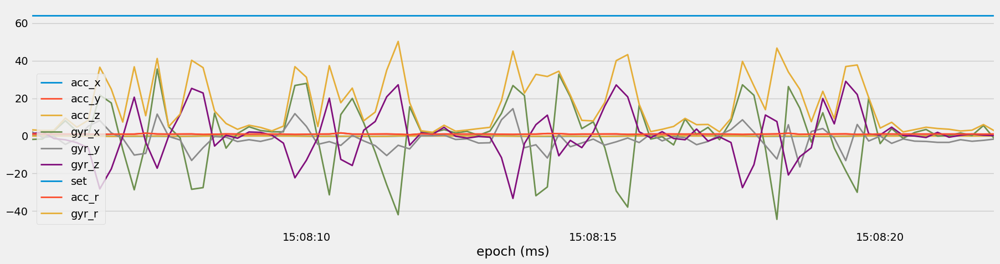

In [14]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]].plot()

<Axes: xlabel='epoch (ms)'>

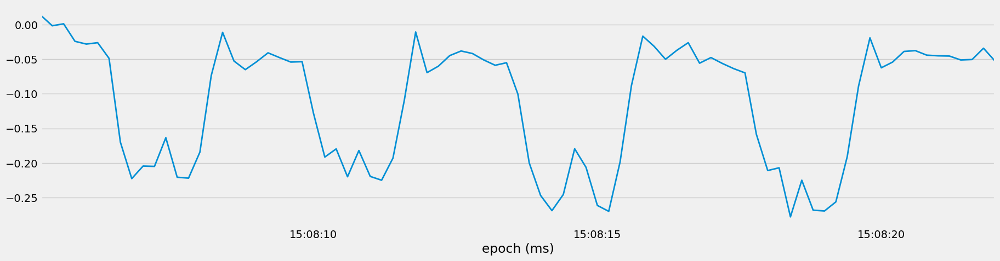

In [15]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_x"].plot()

<Axes: xlabel='epoch (ms)'>

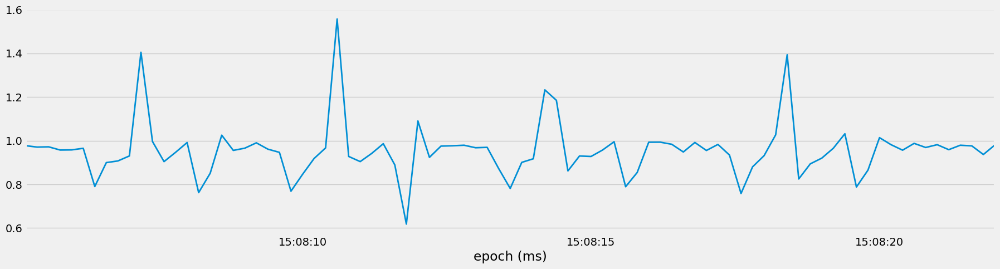

In [16]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_y"].plot()

<Axes: xlabel='epoch (ms)'>

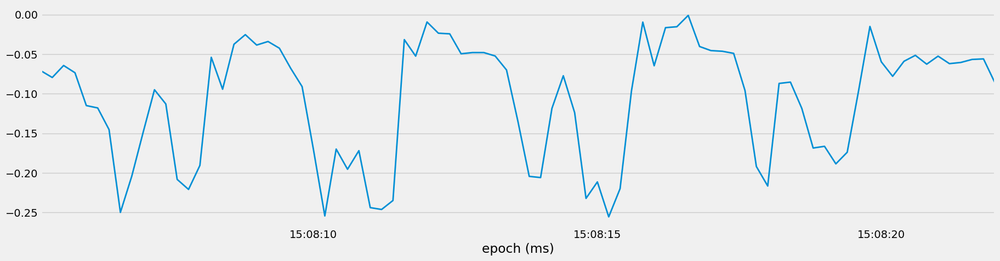

In [17]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_z"].plot()

<Axes: xlabel='epoch (ms)'>

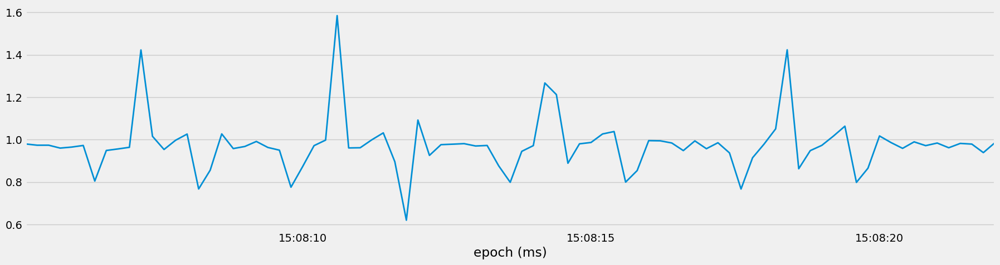

In [18]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["acc_r"].plot()

<Axes: xlabel='epoch (ms)'>

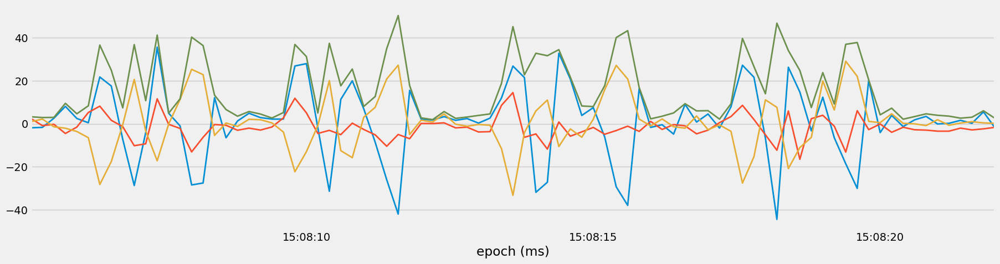

In [19]:
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_x"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_y"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_z"].plot()
plot_df[plot_df["set"] == plot_df["set"].unique()[0]]["gyr_r"].plot()

In [20]:
fs = 1000 / 200

In [21]:
lowpass = LowPassFilter()

In [22]:
bench_set = bench_df[bench_df["set"] == bench_df["set"].unique()[0]]
squat_set = squat_df[squat_df["set"] == squat_df["set"].unique()[0]]
row_set = row_df[row_df["set"] == row_df["set"].unique()[0]]
ohp_set = ohp_df[ohp_df["set"] == ohp_df["set"].unique()[0]]
dead_set = dead_df[dead_df["set"] == dead_df["set"].unique()[0]]

In [23]:
bench_set

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,bench,heavy,B,64,0.979669,3.225625
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,bench,heavy,B,64,0.973752,2.887270
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,bench,heavy,B,64,0.973795,2.936720
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,bench,heavy,B,64,0.960118,9.473502
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,bench,heavy,B,64,0.964953,4.623585
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,bench,heavy,B,64,0.961738,3.529012
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,bench,heavy,B,64,0.982193,2.592911
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,bench,heavy,B,64,0.978938,3.034609


In [24]:
squat_set

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 16:05:44.600,0.135333,0.694667,0.735333,2.5366,-0.6220,1.6098,squat,medium,A,69,1.020584,3.068009
2019-01-11 16:05:44.800,0.097500,0.651500,0.658000,2.0854,0.0366,0.1952,squat,medium,A,69,0.931087,2.094835
2019-01-11 16:05:45.000,0.148667,0.719667,0.694333,-0.0364,1.2562,0.0242,squat,medium,A,69,1.011000,1.256960
2019-01-11 16:05:45.200,0.138000,0.692000,0.632000,5.9878,-4.5734,1.0976,squat,medium,A,69,0.947276,7.614096
2019-01-11 16:05:45.400,0.131667,0.716000,0.658000,-4.1586,-2.9636,-0.5852,squat,medium,A,69,0.981303,5.139975
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 16:05:59.800,0.185333,0.694667,0.853667,2.7318,6.5366,4.4998,squat,medium,A,69,1.116090,8.392739
2019-01-11 16:06:00.000,0.172500,0.694500,0.824000,12.2806,1.1708,3.1710,squat,medium,A,69,1.091358,12.737313
2019-01-11 16:06:00.200,0.173667,0.760333,0.806667,24.5852,6.8902,4.1584,squat,medium,A,69,1.122042,25.868885


In [25]:
dead_set

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 16:24:24.800,0.056500,-1.027000,-0.165500,3.231667,-2.6830,2.418667,dead,medium,A,57,1.041783,4.846866
2019-01-11 16:24:25.000,0.073333,-1.025000,-0.155333,12.853600,-30.9024,4.487800,dead,medium,A,57,1.039294,33.768531
2019-01-11 16:24:25.200,0.059000,-1.022000,-0.125500,2.073200,-1.2316,3.170800,dead,medium,A,57,1.031366,3.983588
2019-01-11 16:24:25.400,0.030667,-1.031667,-0.114667,-0.329600,3.1098,1.817000,dead,medium,A,57,1.038472,3.616764
2019-01-11 16:24:25.600,0.046500,-1.025500,-0.124500,-0.975600,9.7682,-2.219400,dead,medium,A,57,1.034076,10.064555
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 16:24:54.800,0.039000,-1.337500,-0.105500,-19.000000,18.5000,-3.829400,dead,medium,A,57,1.342221,26.793923
2019-01-11 16:24:55.000,0.081667,-1.006000,-0.094667,-15.719600,24.2926,13.695200,dead,medium,A,57,1.013739,32.012415
2019-01-11 16:24:55.200,0.033500,-1.052000,-0.185000,-0.060800,-4.8294,7.317200,dead,medium,A,57,1.068668,8.767452


<Axes: xlabel='epoch (ms)'>

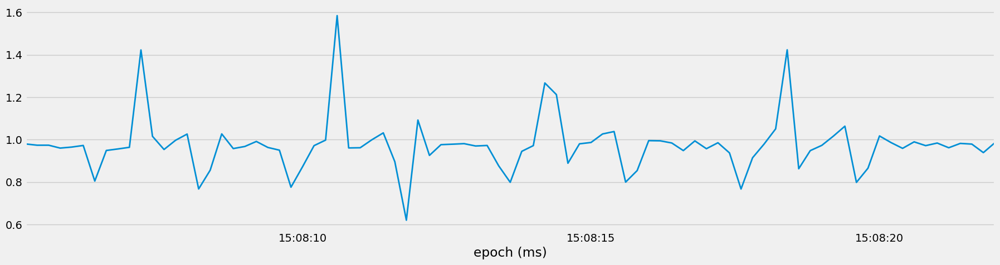

In [26]:
bench_set["acc_r"].plot()

In [27]:
lowpass.low_pass_filter(bench_set["acc_r"], fs = fs, cutoff_frequency=0.4, order=5)

TypeError: LowPassFilter.low_pass_filter() got an unexpected keyword argument 'fs'

In [28]:
lowpass.low_pass_filter(bench_set["acc_r"], sampling_frequency= fs, cutoff_frequency=0.4, order=5)

TypeError: LowPassFilter.low_pass_filter() missing 1 required positional argument: 'col'

In [29]:
cols = "acc_r"

In [30]:
lowpass.low_pass_filter(bench_set, cols, sampling_frequency= fs, cutoff_frequency=0.4, order=5)

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set,acc_r,gyr_r,acc_r_lowpass
epoch (ms),,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,bench,heavy,B,64,0.979669,3.225625,0.981060
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,bench,heavy,B,64,0.973752,2.887270,0.961606
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,bench,heavy,B,64,0.973795,2.936720,0.945699
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,bench,heavy,B,64,0.960118,9.473502,0.936613
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,bench,heavy,B,64,0.964953,4.623585,0.936412
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,bench,heavy,B,64,0.961738,3.529012,0.980293
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,bench,heavy,B,64,0.982193,2.592911,0.983985
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,bench,heavy,B,64,0.978938,3.034609,0.986107


In [31]:
col = "acc_r"

In [32]:
lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set,acc_r,gyr_r,acc_r_lowpass
epoch (ms),,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,bench,heavy,B,64,0.979669,3.225625,0.981060
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,bench,heavy,B,64,0.973752,2.887270,0.961606
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,bench,heavy,B,64,0.973795,2.936720,0.945699
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,bench,heavy,B,64,0.960118,9.473502,0.936613
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,bench,heavy,B,64,0.964953,4.623585,0.936412
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,bench,heavy,B,64,0.961738,3.529012,0.980293
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,bench,heavy,B,64,0.982193,2.592911,0.983985
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,bench,heavy,B,64,0.978938,3.034609,0.986107


In [33]:
lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)[column + "_lowpass"].plot()

NameError: name 'column' is not defined

<Axes: xlabel='epoch (ms)'>

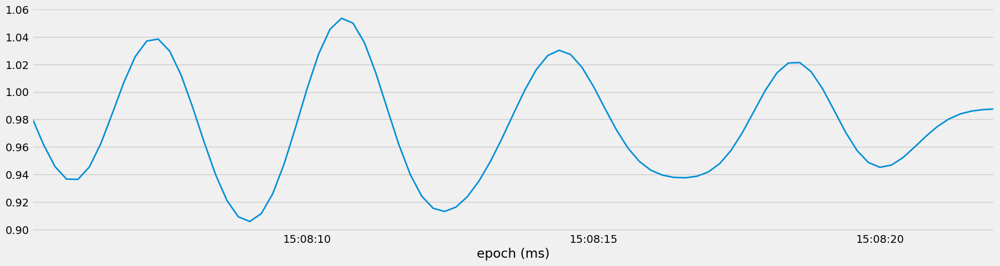

In [34]:
lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)[col + "_lowpass"].plot()

In [35]:
col = "acc_y"

<Axes: xlabel='epoch (ms)'>

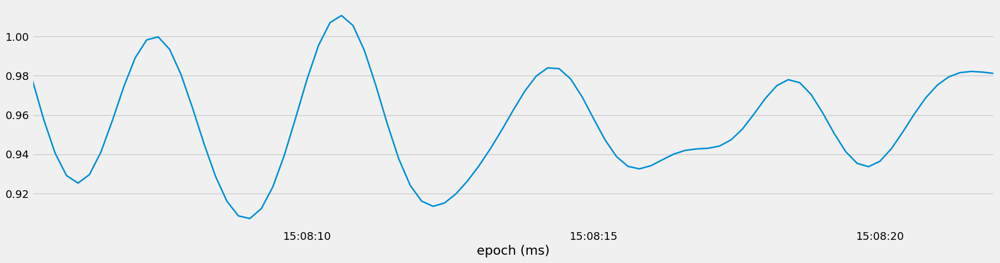

In [36]:
lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)[col + "_lowpass"].plot()

<Axes: xlabel='epoch (ms)'>

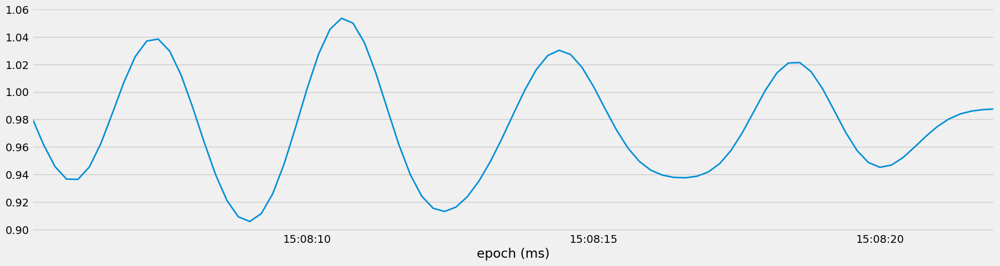

In [37]:
col = "acc_r"
lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)[col + "_lowpass"].plot()

<Axes: xlabel='epoch (ms)'>

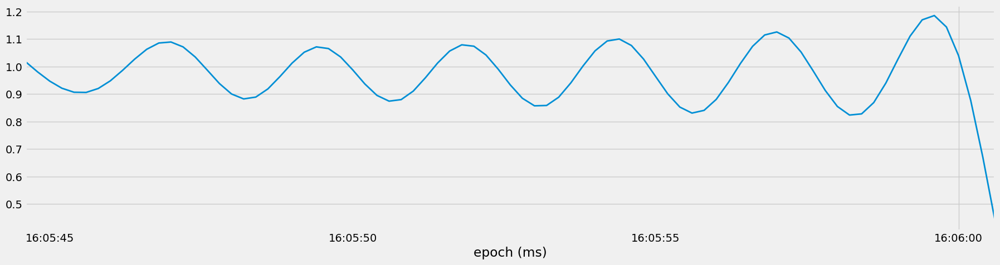

In [38]:
lowpass.low_pass_filter(squat_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)[col + "_lowpass"].plot()

<Axes: xlabel='epoch (ms)'>

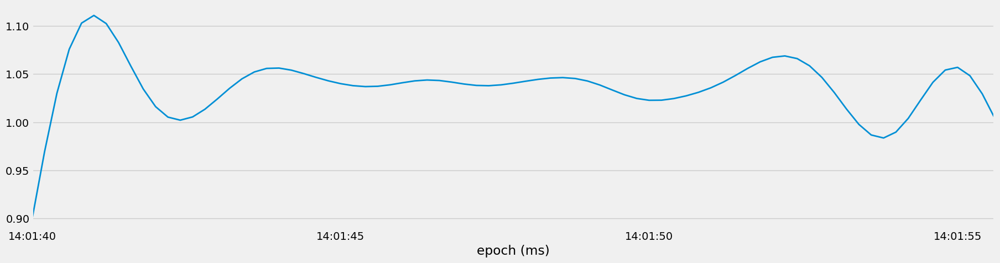

In [39]:
lowpass.low_pass_filter(row_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)[col + "_lowpass"].plot()

<Axes: xlabel='epoch (ms)'>

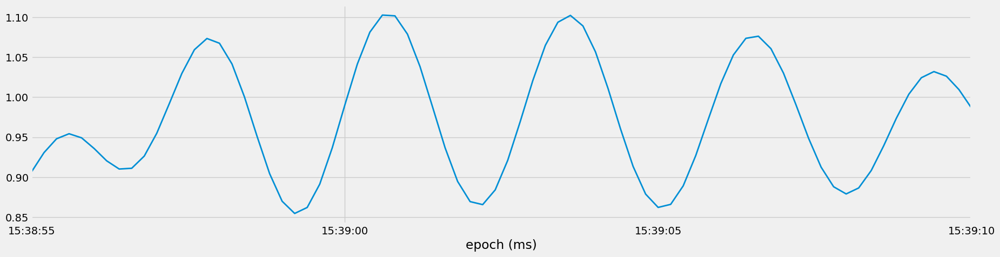

In [40]:
lowpass.low_pass_filter(ohp_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)[col + "_lowpass"].plot()

<Axes: xlabel='epoch (ms)'>

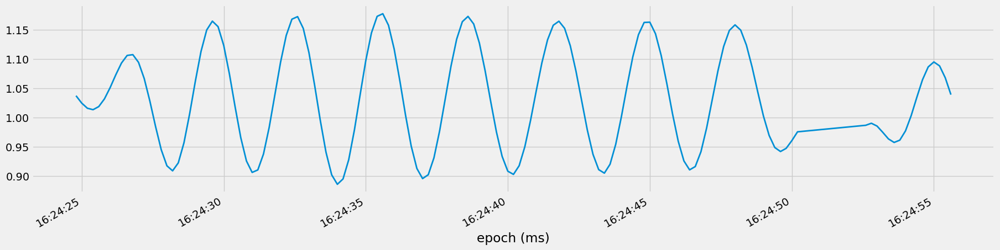

In [41]:
lowpass.low_pass_filter(dead_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)[col + "_lowpass"].plot()

In [42]:
argrelextrema(bench_set["acc_r"].values, np.greater)

(array([ 2,  5, 10, 14, 17, 20, 27, 31, 34, 38, 40, 45, 51, 54, 58, 60, 66,
        71, 74, 77, 79, 81]),)

In [43]:
col = "acc_y"

In [44]:
data = lowpass.low_pass_filter(dead_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)

In [45]:
data

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set,acc_r,gyr_r,acc_r_lowpass,acc_y_lowpass
epoch (ms),,,,,,,,,,,,,,
2019-01-11 16:24:24.800,0.056500,-1.027000,-0.165500,3.231667,-2.6830,2.418667,dead,medium,A,57,1.041783,4.846866,1.037553,-1.022465
2019-01-11 16:24:25.000,0.073333,-1.025000,-0.155333,12.853600,-30.9024,4.487800,dead,medium,A,57,1.039294,33.768531,1.024975,-1.010595
2019-01-11 16:24:25.200,0.059000,-1.022000,-0.125500,2.073200,-1.2316,3.170800,dead,medium,A,57,1.031366,3.983588,1.016197,-1.002753
2019-01-11 16:24:25.400,0.030667,-1.031667,-0.114667,-0.329600,3.1098,1.817000,dead,medium,A,57,1.038472,3.616764,1.013722,-1.001589
2019-01-11 16:24:25.600,0.046500,-1.025500,-0.124500,-0.975600,9.7682,-2.219400,dead,medium,A,57,1.034076,10.064555,1.019024,-1.008638
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 16:24:54.800,0.039000,-1.337500,-0.105500,-19.000000,18.5000,-3.829400,dead,medium,A,57,1.342221,26.793923,1.086772,-1.076719
2019-01-11 16:24:55.000,0.081667,-1.006000,-0.094667,-15.719600,24.2926,13.695200,dead,medium,A,57,1.013739,32.012415,1.095282,-1.086478
2019-01-11 16:24:55.200,0.033500,-1.052000,-0.185000,-0.060800,-4.8294,7.317200,dead,medium,A,57,1.068668,8.767452,1.088561,-1.079414


In [46]:
data = lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)

In [47]:
data

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set,acc_r,gyr_r,acc_r_lowpass,acc_y_lowpass
epoch (ms),,,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,bench,heavy,B,64,0.979669,3.225625,0.981060,0.978254
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,bench,heavy,B,64,0.973752,2.887270,0.961606,0.957920
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,bench,heavy,B,64,0.973795,2.936720,0.945699,0.940598
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,bench,heavy,B,64,0.960118,9.473502,0.936613,0.929100
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,bench,heavy,B,64,0.964953,4.623585,0.936412,0.925264
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:08:21.200,-0.045333,0.958667,-0.062000,0.2074,-3.4512,-0.7072,bench,heavy,B,64,0.961738,3.529012,0.980293,0.979448
2019-01-11 15:08:21.400,-0.051000,0.979000,-0.060500,1.5732,-2.0366,0.3170,bench,heavy,B,64,0.982193,2.592911,0.983985,0.981624
2019-01-11 15:08:21.600,-0.050333,0.976000,-0.056667,0.2076,-2.8660,0.9756,bench,heavy,B,64,0.978938,3.034609,0.986107,0.982220


In [48]:
data[col + "_lowpass"].values

array([0.97825401, 0.9579202 , 0.94059755, 0.92909969, 0.92526383,
       0.92957844, 0.94100788, 0.95709805, 0.97440598, 0.9892071 ,
       0.99832348, 0.9998404 , 0.99348919, 0.9805857 , 0.96357752,
       0.94538858, 0.92879501, 0.91600985, 0.90853119, 0.90718178,
       0.91219723, 0.92323711, 0.93928534, 0.95852201, 0.97832553,
       0.99555035, 1.00711254, 1.01074865, 1.00568242, 0.99292144,
       0.97503458, 0.9554671 , 0.93763057, 0.92407954, 0.91603788,
       0.91339416, 0.91510533, 0.91980284, 0.92634057, 0.93407552,
       0.94280293, 0.95242208, 0.96252778, 0.97215726, 0.97985238,
       0.98404659, 0.98362286, 0.97839612, 0.9693011 , 0.95819583,
       0.9473498 , 0.93880045, 0.93379653, 0.93250892, 0.93409775,
       0.93710701, 0.94004488, 0.94194205, 0.94268691, 0.94301626,
       0.94416207, 0.94727998, 0.95287217, 0.96043392, 0.9684824 ,
       0.97498267, 0.97802151, 0.97647292, 0.97040392, 0.96108434,
       0.95062265, 0.94137549, 0.93532936, 0.93363412, 0.93640

In [49]:
argrelextrema(data[col + "_lowpass"].values, np.greater)

(array([11, 27, 45, 66, 82]),)

In [50]:
indexes = argrelextrema(data[col + "_lowpass"].values, np.greater)

In [51]:
peaks = data.iloc[indexes]

In [52]:
def count_reps(dataset, cutoff = 0.4, order = 5, col = "acc_r")
    data = lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)

    # indexes of the peaks
    indexes = argrelextrema(data[col + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    
    return len(peaks)

SyntaxError: expected ':' (<ipython-input-52-12e73944fa66>, line 1)

In [53]:
def count_reps(dataset, cutoff = 0.4, order = 5, col = "acc_r")
    data = lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5):

    # indexes of the peaks
    indexes = argrelextrema(data[col + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    
    return len(peaks)

SyntaxError: expected ':' (<ipython-input-53-14787fd000a9>, line 1)

In [54]:
def count_reps(dataset, cutoff = 0.4, order = 5, col = "acc_r"):
    data = lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)
    # indexes of the peaks
    indexes = argrelextrema(data[col + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    return len(peaks)

In [55]:
count_reps(squat_set)

4

In [56]:
def count_reps(dataset, cutoff = 0.4, order = 5, col = "acc_r"):
    data = lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=0.4, order=5)
    # indexes of the peaks
    indexes = argrelextrema(data[col + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    fig, ax = plt.subplots()
    plt.plot(dataset[f"{col}_lowpass"])
    plt.plot(peaks[f"{col}_lowpass"], "o", color="red")
    ax.set_ylabel(f"{col}_lowpass")
    exercise = dataset["label"].iloc[0].title()
    category = dataset["category"].iloc[0].title()
    plt.title(f"{category} {exercise}: {len(peaks)} Reps")
    plt.show()
    return len(peaks)

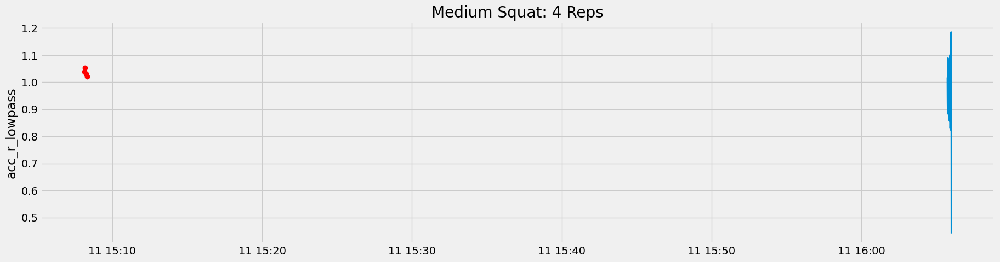

4

In [57]:
count_reps(squat_set)

In [58]:
def count_reps(dataset, cutoff = 0.4, order = 10, col = "acc_r"):
    data = lowpass.low_pass_filter(bench_set, col = col, sampling_frequency= fs, cutoff_frequency=cutoff, order=order)
    # indexes of the peaks
    indexes = argrelextrema(data[col + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    fig, ax = plt.subplots()
    plt.plot(dataset[f"{col}_lowpass"])
    plt.plot(peaks[f"{col}_lowpass"], "o", color="red")
    ax.set_ylabel(f"{col}_lowpass")
    exercise = dataset["label"].iloc[0].title()
    category = dataset["category"].iloc[0].title()
    plt.title(f"{category} {exercise}: {len(peaks)} Reps")
    plt.show()
    return len(peaks)

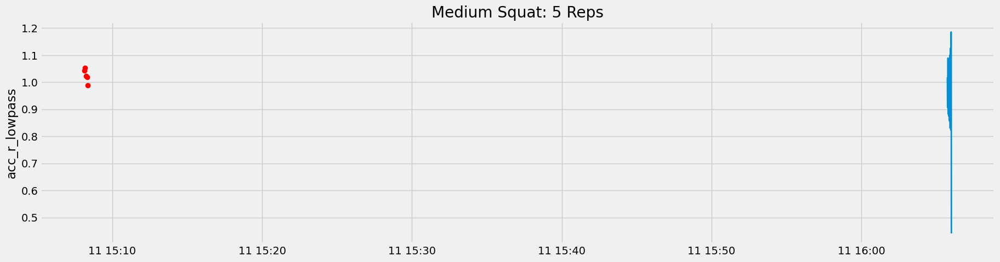

5

In [59]:
count_reps(squat_set)

In [60]:
def count_reps(dataset, cutoff = 0.4, order = 10, column = "acc_r"):
    data = lowpass.low_pass_filter(bench_set, col = column, sampling_frequency= fs, cutoff_frequency=cutoff, order=order)
    # indexes of the peaks
    indexes = argrelextrema(data[column + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    fig, ax = plt.subplots()
    plt.plot(dataset[f"{column}_lowpass"])
    plt.plot(peaks[f"{column}_lowpass"], "o", color="red")
    ax.set_ylabel(f"{column}_lowpass")
    exercise = dataset["label"].iloc[0].title()
    category = dataset["category"].iloc[0].title()
    plt.title(f"{category} {exercise}: {len(peaks)} Reps")
    plt.show()
    return len(peaks)

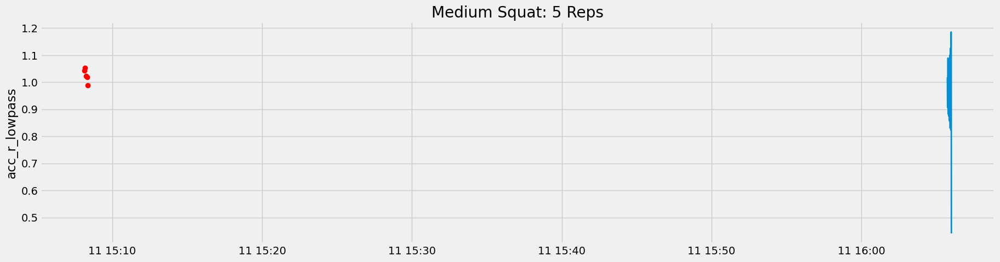

5

In [61]:
count_reps(squat_set)

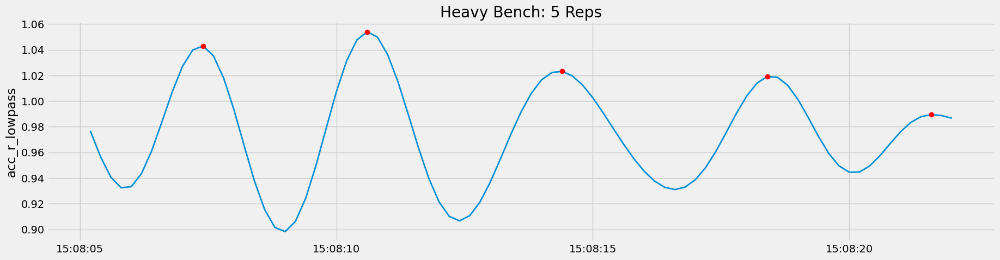

5

In [62]:
count_reps(bench_set, cutoff=0.4)

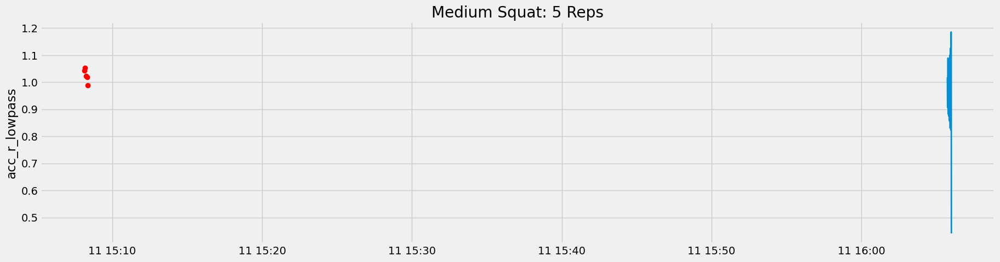

5

In [63]:
count_reps(squat_set)

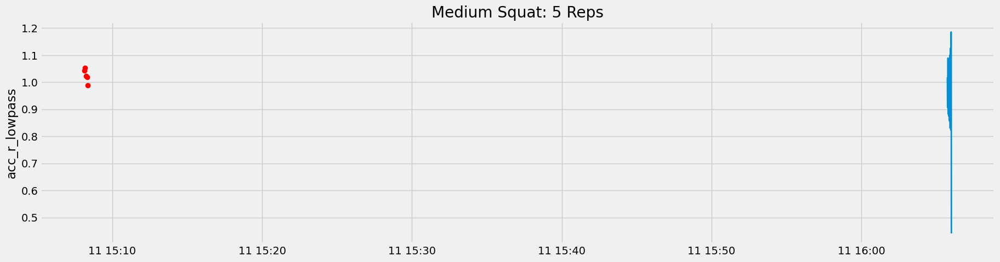

5

In [64]:
count_reps(squat_set, cutoff=0.4)

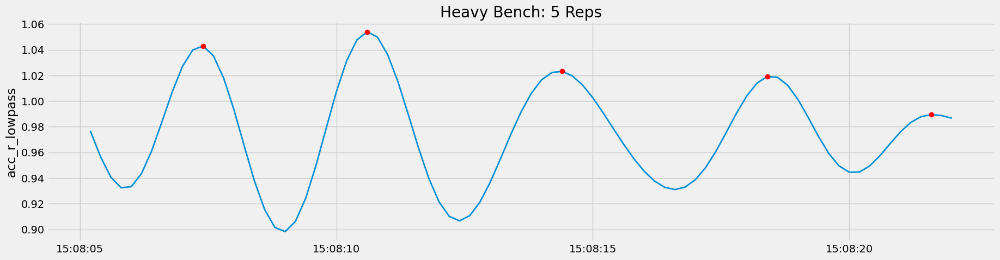

5

In [65]:
count_reps(bench_set, cutoff=0.4)

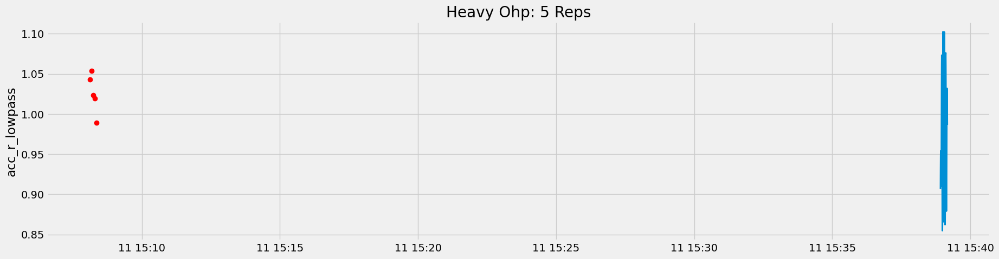

5

In [66]:
count_reps(ohp_set, cutoff=0.4)

In [67]:
def count_reps(dataset, cutoff = 0.4, order = 10, col = "acc_r"):
    data = lowpass.low_pass_filter(dataset, col = col, sampling_frequency= fs, cutoff_frequency=cutoff, order=order)
    # indexes of the peaks
    indexes = argrelextrema(data[col + "_lowpass"].values, np.greater)
    peaks = data.iloc[indexes]
    fig, ax = plt.subplots()
    plt.plot(dataset[f"{col}_lowpass"])
    plt.plot(peaks[f"{col}_lowpass"], "o", color="red")
    ax.set_ylabel(f"{col}_lowpass")
    exercise = dataset["label"].iloc[0].title()
    category = dataset["category"].iloc[0].title()
    plt.title(f"{category} {exercise}: {len(peaks)} Reps")
    plt.show()
    return len(peaks)

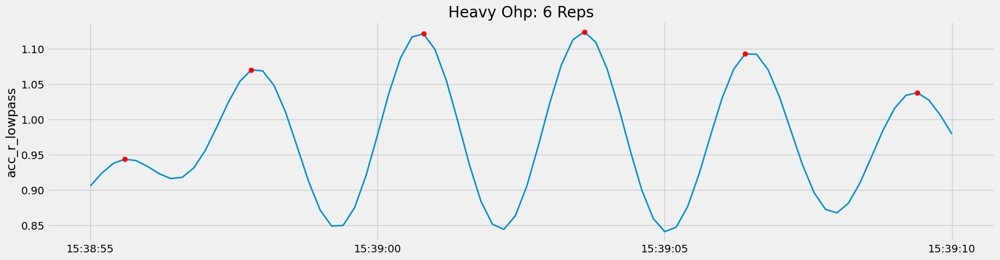

6

In [68]:
count_reps(ohp_set)

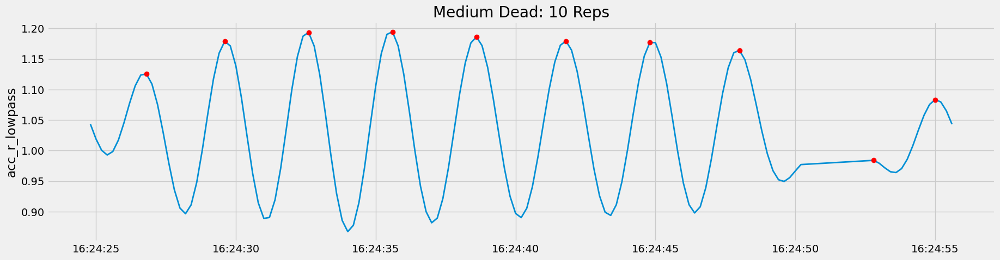

10

In [69]:
count_reps(dead_set)

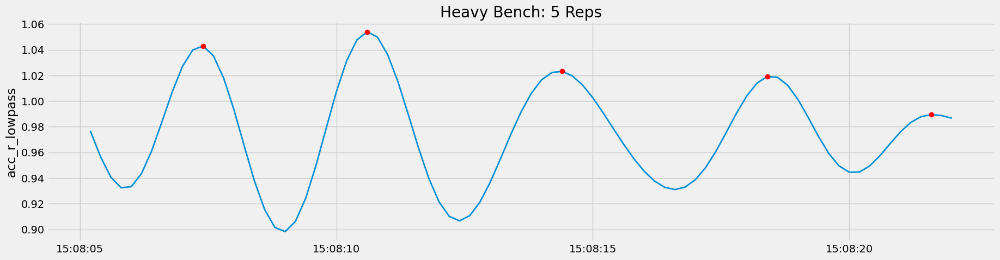

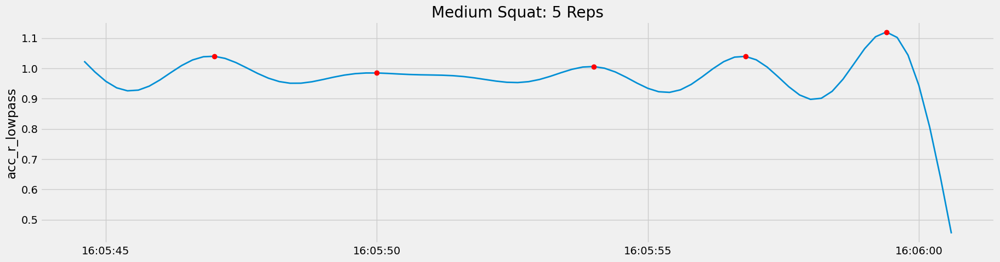

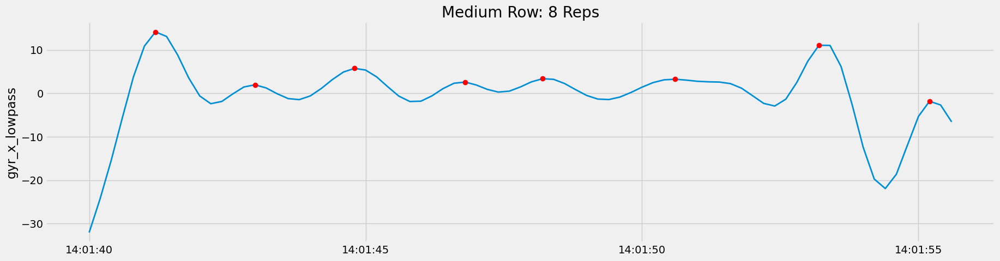

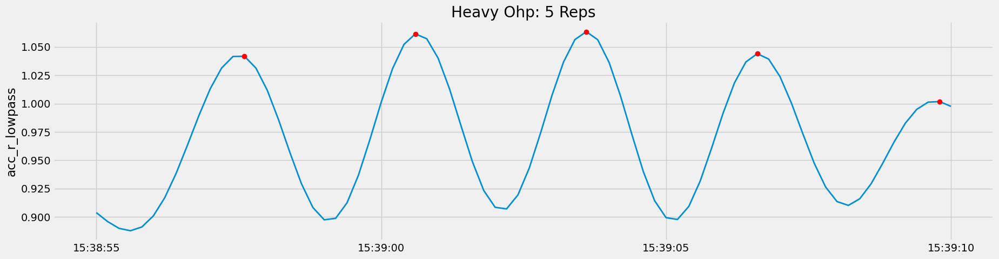

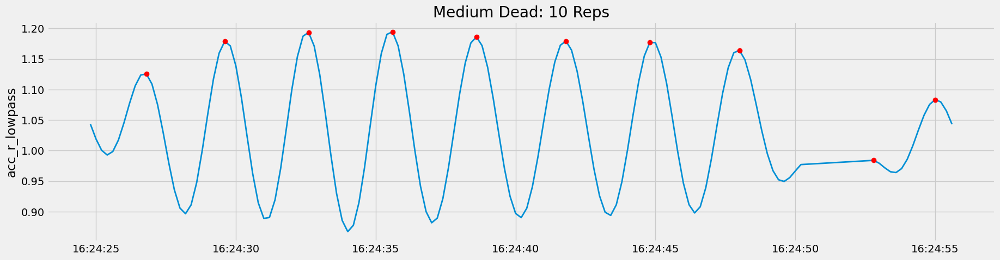

10

In [70]:
count_reps(bench_set, cutoff=0.4)
count_reps(squat_set, cutoff=0.35)
count_reps(row_set, cutoff=0.6, col="gyr_x")
count_reps(ohp_set, cutoff=0.35)
count_reps(dead_set, cutoff=0.4)

In [71]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set,acc_r,gyr_r
epoch (ms),,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,bench,heavy,B,64,0.979669,3.225625
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,bench,heavy,B,64,0.973752,2.887270
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,bench,heavy,B,64,0.973795,2.936720
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,bench,heavy,B,64,0.960118,9.473502
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,bench,heavy,B,64,0.964953,4.623585
...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,row,medium,E,71,1.045408,5.804424
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,row,medium,E,71,1.032376,3.611408
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,row,medium,E,71,1.035995,5.869377


In [72]:
df["reps"] = df["category"].apply(lambda x: 5 if x == "heavy" else 10)

In [73]:
df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,label,category,participant,set,acc_r,gyr_r,reps
epoch (ms),,,,,,,,,,,,,
2019-01-11 15:08:05.200,0.013500,0.977000,-0.071000,-1.8904,2.4392,0.9388,bench,heavy,B,64,0.979669,3.225625,5
2019-01-11 15:08:05.400,-0.001500,0.970500,-0.079500,-1.6826,-0.8904,2.1708,bench,heavy,B,64,0.973752,2.887270,5
2019-01-11 15:08:05.600,0.001333,0.971667,-0.064333,2.5608,-0.2560,-1.4146,bench,heavy,B,64,0.973795,2.936720,5
2019-01-11 15:08:05.800,-0.024000,0.957000,-0.073500,8.0610,-4.5244,-2.0730,bench,heavy,B,64,0.960118,9.473502,5
2019-01-11 15:08:06.000,-0.028000,0.957667,-0.115000,2.4390,-1.5486,-3.6098,bench,heavy,B,64,0.964953,4.623585,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.000,-0.048000,-1.041500,-0.076500,1.4146,-5.6218,0.2926,row,medium,E,71,1.045408,5.804424,10
2019-01-20 17:33:27.200,-0.037000,-1.030333,-0.053333,-2.7684,-0.5854,2.2440,row,medium,E,71,1.032376,3.611408,10
2019-01-20 17:33:27.400,-0.060000,-1.031000,-0.082000,2.8416,-5.1342,-0.1220,row,medium,E,71,1.035995,5.869377,10


In [74]:
rep_df = df.groupby(["label", "category", "set"])["reps"].max().reset_index()

In [75]:
rep_df

,label,category,set,reps
0,bench,heavy,5,5
1,bench,heavy,7,5
2,bench,heavy,16,5
3,bench,heavy,23,5
4,bench,heavy,40,5
...,...,...,...,...
80,squat,medium,60,10
81,squat,medium,63,10
82,squat,medium,69,10
83,squat,medium,92,10


In [76]:
rep_df["reps_pred"] = 0

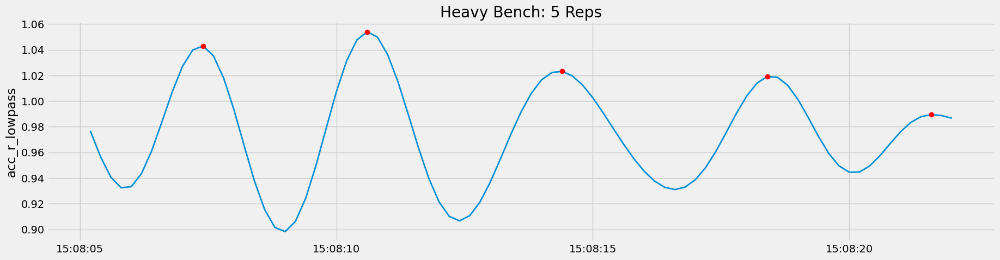

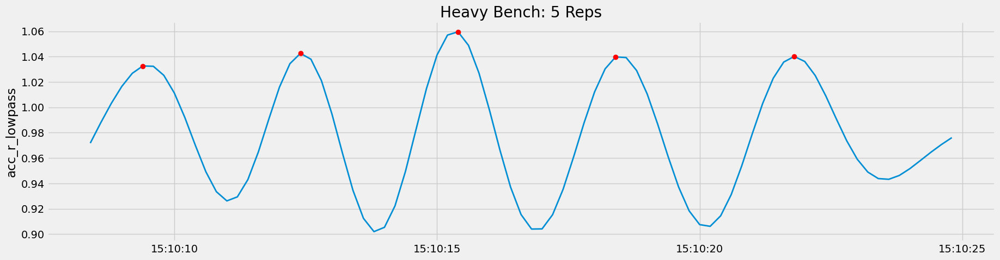

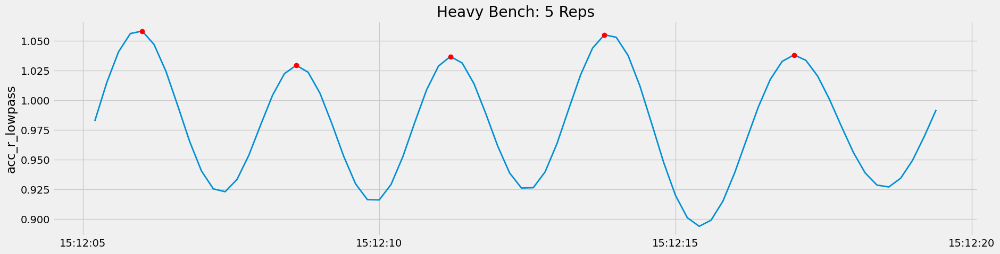

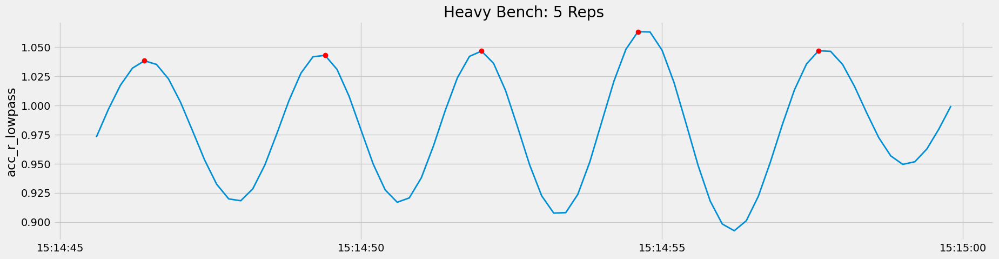

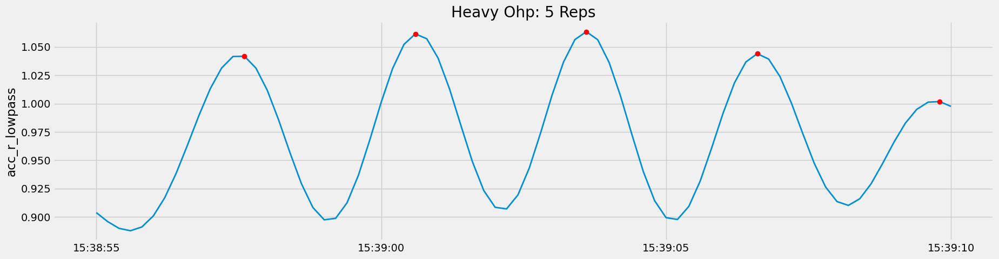

...

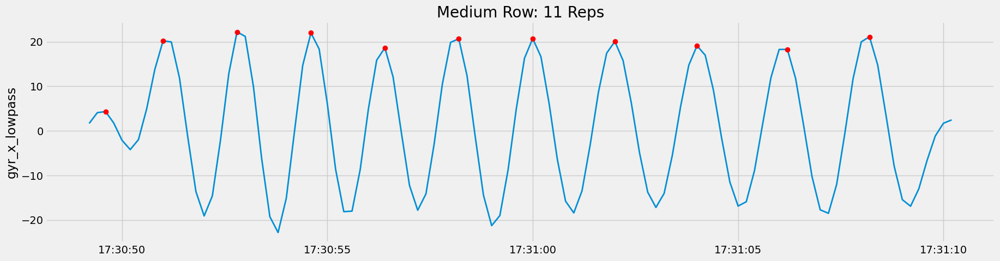

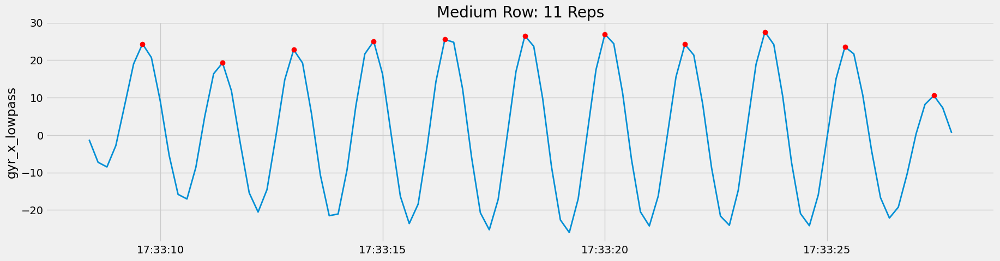

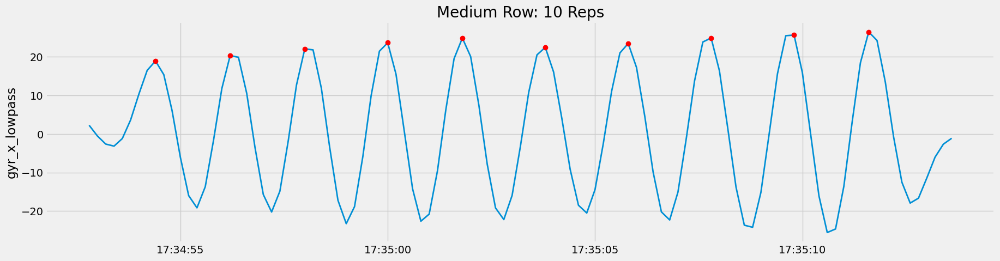

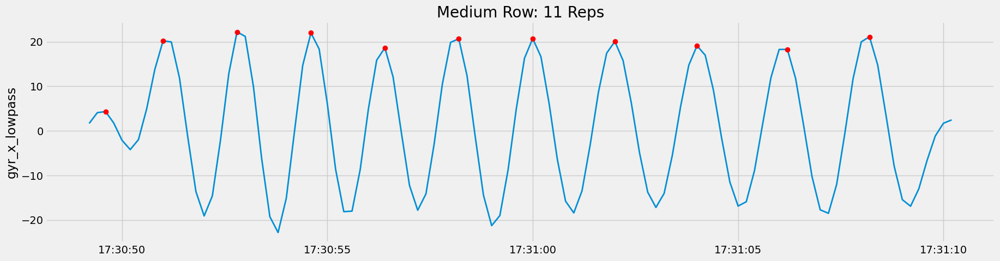

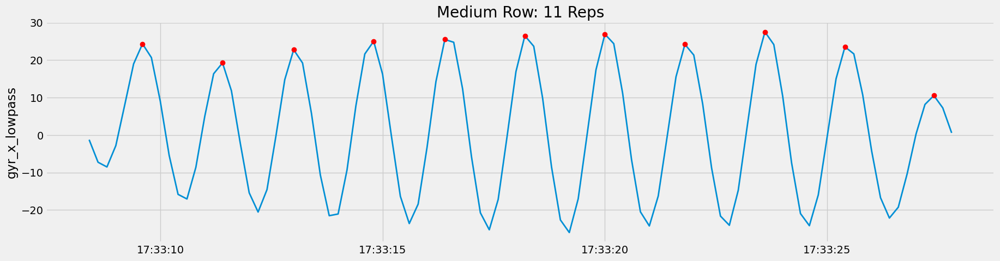

In [77]:
for s in df["set"].unique():
    subset = df[df["set"] == s]
    col = "acc_r"
    cutoff = 0.4
    if subset["label"].iloc[0] == "squat":
        cutoff = 0.35
    if subset["label"].iloc[0] == "row":
        cutoff = 0.65
        col = "gyr_x"
    if subset["label"].iloc[0] == "ohp":
        cutoff = 0.35
    reps = count_reps(subset, cutoff=cutoff, col=col)
    rep_df.loc[rep_df["set"] == s, "reps_pred"] = reps

In [78]:
rep_df

,label,category,set,reps,reps_pred
0,bench,heavy,5,5,4
1,bench,heavy,7,5,5
2,bench,heavy,16,5,5
3,bench,heavy,23,5,5
4,bench,heavy,40,5,5
...,...,...,...,...,...
80,squat,medium,60,10,8
81,squat,medium,63,10,7
82,squat,medium,69,10,5
83,squat,medium,92,10,8


In [79]:
error = mean_absolute_error(rep_df["reps"], rep_df["reps_pred"]).round(2)

In [80]:
error

np.float64(0.88)

In [81]:
rep_df.groupby(["label", "category"])["reps", "reps_pred"].mean().plot.bar()

ValueError: Cannot subset columns with a tuple with more than one element. Use a list instead.

<Axes: xlabel='label,category'>

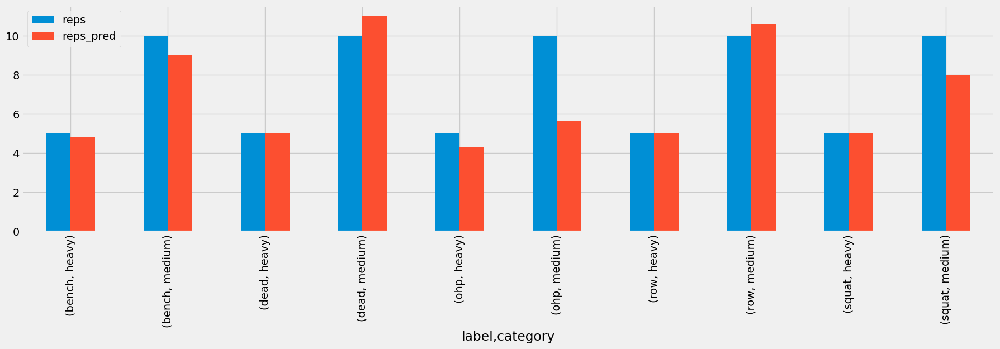

In [82]:
rep_df.groupby(["label", "category"])[["reps", "reps_pred"]].mean().plot.bar()